In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.2/664.8 MB 33.4 MB/s eta 0:00:15

In [ ]:
!pip install torch-fidelity

## Data Preparation

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

In [ ]:
import os
os.makedirs("train", exist_ok=True)
os.makedirs("val", exist_ok=True)

In [ ]:
ROOT_DIR = "/content/drive/MyDrive/DeepRazor/GAN2"
CHKPT_DIR = f"{ROOT_DIR}/Checkpoints"
LOG_DIR = f"{ROOT_DIR}/Logs"
VAL_IMG_DIR = f"{ROOT_DIR}/Results"
TRAIN_CSV_PATH = f"{LOG_DIR}/train.csv"
VAL_CSV_PATH = f"{LOG_DIR}/val.csv"

In [ ]:
from zipfile import ZipFile
def unzip_data(file_path, extract_path):
    with ZipFile(file_path, 'r') as zip:
        zip.extractall(extract_path)
        zip.close()

In [ ]:
unzip_data("/content/drive/MyDrive/RORD-small-dataset/gt.zip", "train")
unzip_data("/content/drive/MyDrive/RORD-small-dataset/img.zip", "train")
# unzip_data("/content/drive/MyDrive/RORD-small-dataset/label.zip", "train")
unzip_data("/content/drive/MyDrive/RORD-small-dataset/mask.zip", "train")
unzip_data("/content/drive/MyDrive/RORD-small-dataset/val.zip", ".")

In [ ]:
def remove_stale_files(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            if file.startswith("._"):
                os.remove(os.path.join(root, file))
                # print(f"Removed: {os.path.join(root, file)}")

# Run this on your dataset directories
remove_stale_files("train/img")
remove_stale_files("train/mask")
remove_stale_files("train/gt")
remove_stale_files("train/label")
remove_stale_files("val/img")
remove_stale_files("val/mask")
remove_stale_files("val/gt")
remove_stale_files("val/label")

In [ ]:
import torch
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class ObjectRemovalDataset(Dataset):
    def __init__(self, data_type="train", transform=None):
        self.data_type = data_type
        self.transform = transform

        self.img_dir = f"{self.data_type}/img"
        self.mask_dir = f"{self.data_type}/mask"
        self.gt_dir = f"{self.data_type}/gt"

        # Create folders for input_dir
        self.folders_li = self.filter_files(os.listdir(self.img_dir))

        # Create files list
        self.files_li = self.get_basename(self.img_dir)
        self.img_files = [f"{file}.jpg" for file in self.files_li]
        self.mask_files = [f"{file}_M.png" for file in self.files_li]
        self.gt_files = [f"{file}.jpg" for file in self.files_li]

    def __len__(self):
        return len(self.img_files)

    def filter_files(self, files_li):
        return [f for f in files_li if not f.startswith("._")]

    def get_basename(self, dir_path):
        files_li = list()
        for folder in self.folders_li:
            files = self.filter_files(os.listdir(os.path.join(dir_path, folder)))
            for _file in files:
                file_path = f"{folder}/{_file}".split('.')[0]
                files_li.append(file_path)
        return files_li

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_files[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_files[idx])
        gt_path = os.path.join(self.gt_dir, self.gt_files[idx])

        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        gt = Image.open(gt_path).convert("RGB")

        # transform img, mask, gt together with self.transform()
        if self.transform:
            img = self.transform(img)
            mask = self.transform(mask)
            gt = self.transform(gt)

        mask = 1 - mask  # Invert the mask: 1 represents hole

        return img, mask, gt

In [ ]:
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

num_workers = os.cpu_count()
train_dataset = ObjectRemovalDataset(data_type="train", transform=transform)
val_dataset = ObjectRemovalDataset(data_type="val", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=True, num_workers=num_workers)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
def visualize_samples(dataloader, num_samples=4):
    data_iter = iter(dataloader)
    input_data, mask_data, gt_data = next(data_iter)  # First batch

    for i in range(num_samples):
        input_sample = input_data[i]
        mask_sample = mask_data[i]
        gt_sample = gt_data[i]
        infused_sample = input_sample * (1 - mask_sample)
        # print(mask_sample)

        # Convert tensors to numpy arrays
        input_sample_np = input_sample.permute(1, 2, 0).cpu().numpy()
        mask_sample_np = mask_sample.squeeze(0).cpu().numpy()  # Remove extra dimensions
        gt_sample_np = gt_sample.permute(1, 2, 0).cpu().numpy()
        infused_sample_np = infused_sample.permute(1, 2, 0).cpu().numpy()

        # Rescale the image tensors from [0, 1] to [0, 255] for visualization
        input_sample_np = np.clip(input_sample_np * 255, 0, 255).astype(np.uint8)
        gt_sample_np = np.clip(gt_sample_np * 255, 0, 255).astype(np.uint8)
        infused_sample_np = np.clip(infused_sample_np * 255, 0, 255).astype(np.uint8)

        # Normalize mask values to binary (0 and 255)
        mask_sample_np = np.clip(mask_sample_np * 255, 0, 255).astype(np.uint8)
        mask_sample_np = np.where(mask_sample_np > 128, 255, 0)  # Set mask to 0 or 255

        # Plot the images
        plt.figure(figsize=(12, 12))

        # Display input image
        plt.subplot(1, 4, 1)
        plt.imshow(input_sample_np)
        plt.title("Image")
        plt.axis("off")

        # Display mask
        plt.subplot(1, 4, 2)
        plt.imshow(mask_sample_np, cmap="gray")
        plt.title("Mask")
        plt.axis("off")

        # Display ground truth
        plt.subplot(1, 4, 3)
        plt.imshow(gt_sample_np)
        plt.title("Ground Truth")
        plt.axis("off")

        # Display infused image (mask applied on input)
        plt.subplot(1, 4, 4)
        plt.imshow(infused_sample_np)
        plt.title("Infused Image")
        plt.axis("off")

        plt.show()

In [ ]:
visualize_samples(train_loader, 4)

## TERLU

$${
f(x) =
\begin{cases}
\alpha (e^x - 1) & \text{if } x \leq 0 \\
x & \text{if } 0 < x < \mu \\
\beta \left( \mu - \left( e^{-(x - \mu)} - 1 \right) \right) & \text{if } x \geq \mu
\end{cases}
}$$

$${
f'(x) =
\begin{cases}
\alpha e^x & \text{if } x \leq 0 \\
1 & \text{if } 0 < x < \mu \\
-f(x) + \beta\mu + \beta & \text{if } x \geq \mu
\end{cases}
}$$




In [ ]:
import torch
import triton
import triton.language as tl

class TERLUFunction(torch.autograd.Function):
    @staticmethod
    @triton.jit
    def forward_kernel(x_ptr, y_ptr, n_elements, alpha, mu, beta_ptr, BLOCK_SIZE: tl.constexpr):
        pid = tl.program_id(axis=0)
        offsets = pid * BLOCK_SIZE + tl.arange(0, BLOCK_SIZE)
        mask = offsets < n_elements

        x = tl.load(x_ptr + offsets, mask=mask)
        beta = tl.load(beta_ptr)

        # Apply the custom activation function based on the given conditions
        y = tl.where(
            x <= 0,
            alpha * (tl.exp(x) - 1),
            tl.where(
                x < mu,
                x,
                beta * (mu - (tl.exp(-(x - mu)) - 1))
            )
        )

        tl.store(y_ptr + offsets, y, mask=mask)


    @staticmethod
    def forward(ctx, x, beta, alpha, mu):
        x_flat = x.view(-1).float()  # Convert to fp32 for Triton
        y = torch.empty_like(x_flat)

        BLOCK_SIZE = 64
        grid = lambda meta: (triton.cdiv(x_flat.numel(), BLOCK_SIZE),)

        TERLUFunction.forward_kernel[grid](
            x_flat, y, x_flat.numel(), alpha, mu, beta, BLOCK_SIZE
        )

        y = y.view_as(x)  # Restore original shape
        ctx.save_for_backward(x, beta)  # Explicitly save tensors
        ctx.alpha = alpha
        ctx.mu = mu
        return y.to(x.dtype)  # Convert back to original dtype


    @staticmethod
    def backward(ctx, grad_output):
        x, beta = ctx.saved_tensors
        alpha, mu = ctx.alpha, ctx.mu

        grad_x = grad_output.clone()

        # Gradient w.r.t. input x
        grad_x = torch.where(x <= 0, alpha * torch.exp(x), grad_x)  # for x <= 0
        grad_x = torch.where((x > 0) & (x < mu), 1.0, grad_x)  # for 0 < x < mu
        grad_x = torch.where(x >= mu, -grad_output + beta * mu + beta, grad_x)  # for x >= mu

        # Gradient w.r.t. beta (only for x >= mu)
        grad_beta = torch.sum(grad_output * (x >= mu) * (mu - (torch.exp(-(x - mu)) - 1)))

        return grad_x, grad_beta, None, None

# PyTorch Module Wrapper
class TERLU(torch.nn.Module):
    def __init__(self, alpha=1.0, mu=1.0, beta_init=1.0):
        super().__init__()
        self.alpha = alpha
        self.mu = mu
        self.beta = torch.nn.Parameter(torch.tensor(beta_init, dtype=torch.float32, device="cuda" if torch.cuda.is_available() else "cpu"))

    def forward(self, x):
        return TERLUFunction.apply(x, self.beta, self.alpha, self.mu)

## Model Preparation

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.nn import Parameter

class Conv_DS(nn.Module): # Depth-Seperable Conv2d
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, dilation):
        super(Conv_DS, self).__init__()
        self.depth_conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=in_channels,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            dilation=dilation,
            groups=in_channels
        )
        self.point_conv(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=1,
            stride=1,
            padding=0,
            groups=1
        )

    def forward(self, input):
        out = self.depth_conv(input)
        out = self.point_conv(out)
        return out

class Conv_SC(nn.Module):   # Single-Channel Conv2d
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, dilation):
        super(Conv_SC, self).__init__()
        self.single_channel_conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=1,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            dilation=dilation,
            groups=1
        )
    def forward(self, input):
        out = self.single_channel_conv(input)
        return out

## Covulation layers

In [ ]:
from torch.nn.utils import spectral_norm
class Conv2dLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride = 1, padding = 0, dilation = 1, pad_type = 'replicate', activation = 'none', norm = 'none', sn = False):
        super(Conv2dLayer, self).__init__()
        # Initialize the padding scheme
        if pad_type == 'reflect':
            self.pad = nn.ReflectionPad2d(padding)
        elif pad_type == 'replicate':
            self.pad = nn.ReplicationPad2d(padding)
        elif pad_type == 'zero':
            self.pad = nn.ZeroPad2d(padding)
        else:
            assert 0, "Unsupported padding type: {}".format(pad_type)

        # Initialize the normalization type
        if norm == 'bn':
            self.norm = nn.BatchNorm2d(out_channels)
        elif norm == 'in':
            self.norm = nn.InstanceNorm2d(out_channels)
        elif norm == 'none':
            self.norm = None
        else:
            assert 0, "Unsupported normalization: {}".format(norm)

        # Initialize the activation funtion
        if activation == 'relu':
            self.activation = nn.ReLU(inplace = True)
        elif activation == 'elu':
            self.activation = nn.ELU(alpha=1.0,inplace=True)
        elif activation == 'lrelu':
            self.activation = nn.LeakyReLU(0.2, inplace = True)
        elif activation == 'tanh':
            self.activation = nn.Tanh()
        elif activation == 'sigmoid':
            self.activation = nn.Sigmoid()
        elif activation == 'none':
            self.activation = None
        else:
            assert 0, "Unsupported activation: {}".format(activation)

        self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding = 0, dilation = dilation)
        if sn:
            self.conv2d = spectral_norm(self.conv2d, n_power_iterations=1, eps=1e-12)

    def forward(self, x):
        x = self.pad(x)
        x = self.conv2d(x)
        if self.activation:
            x = self.activation(x)
        return x

class TransposeConv2dLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride = 1, padding = 0, dilation = 1, pad_type = 'zero', activation = 'lrelu', norm = 'none', sn = False, scale_factor = 2):
        super(TransposeConv2dLayer, self).__init__()
        # Initialize the conv scheme
        self.scale_factor = scale_factor
        self.conv2d = Conv2dLayer(in_channels, out_channels, kernel_size, stride, padding, dilation, pad_type, activation, norm, sn)

    def forward(self, x):
        x = F.interpolate(x, scale_factor = self.scale_factor, mode = 'nearest')
        x = self.conv2d(x)
        return x

## Gated Convulation

$${G = conv(W_{g}, I)}$$
$${F = conv(W_{f}, I)}$$
$${O = \sigma(G) \odot \psi(F)}$$
$${\sigma = sigmoid \space function}$$
$${\psi = activation \space function}$$

$${G = gate \space convulation}$$
$${F = feature \space convulation}$$
$${O = GatedConv2d}$$


In [ ]:
class GatedConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride = 1, padding = 0, dilation = 1, pad_type = 'replicate', activation = 'relu', norm = 'none', sc=False, sn=False):
        super(GatedConv2d, self).__init__()
        self.pad = nn.ReplicationPad2d(padding) # pad : ['Replicate', 'Reflect', 'None']
        # norm : ['none', 'bacth', 'instance']
        self.norm = None
        self.activation = None
        if activation == 'elu':
            # self.norm = nn.InstanceNorm2d(out_channels)
            self.activation = nn.ELU(alpha=1.0, inplace=True) # activation : ['elu', 'relu', 'lrelu']
        elif activation == 'terlu':
            self.activation = TERLU()
        elif activation == 'relu':
            self.activation = nn.ReLU(inplace=True)
        elif activation == 'lrelu':
            self.activation = nn.LeakyReLU(0.2, inplace=True)
        elif activation == 'selu':
            self.activation = nn.SELU(inplace=True)
        elif activation == 'none':
            self.activation = None

        if sc:
            self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding = 0, dilation = dilation)
            self.mask_conv2d = Conv_SC(in_channels, out_channels, kernel_size, stride, padding = 0, dilation = dilation)
        else:
            self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding = 0, dilation = dilation)
            self.mask_conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding=0, dilation=dilation)

        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x_in): # sigmoid(mask) * activation(conv)
        x = self.pad(x_in)
        conv = self.conv2d(x)
        mask = self.mask_conv2d(x)
        if self.norm:
            conv = self.norm(conv)
        if self.activation:
            conv = self.activation(conv)
        gated_mask = self.sigmoid(mask)
        x = gated_mask * conv
        return x

class TransposeGatedConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride = 1, padding = 0, dilation = 1, pad_type = 'zero', activation = 'lrelu', norm = 'none', sc = False, scale_factor = 2):
        super(TransposeGatedConv2d, self).__init__()
        # Initialize the conv scheme
        self.scale_factor = scale_factor
        self.gated_conv2d = GatedConv2d(in_channels, out_channels, kernel_size, stride, padding, dilation, pad_type, activation, norm, sc)

    def forward(self, x):
        x = F.interpolate(x, scale_factor = self.scale_factor, mode = 'nearest')
        x = self.gated_conv2d(x)
        return x

$${ Padding: H_{out} = H_{in} + P_{top} + P_{bottom} }$$

$${Conv2d: H_{out} = \frac{H_{in} + 2 * Padding[0] - dilation[0] * (kernel[0] - 1)}{stride[0]} + 1}$$
$${ TransposeConv2d: H_{out} = (H_{in} - 1) * stride[0] - 2 * Padding[0] + dilation[0] * (kernel[0] - 1)  + P_{out}[0] + 1 }$$


## Coarse

In [ ]:
class Coarse(nn.Module):
    def __init__(self):
        super(Coarse, self).__init__()
        # Initialize the padding scheme
        self.coarse1 = nn.Sequential(
            # encoder
            GatedConv2d(4, 32, 5, 2, 2, sc=True),
            GatedConv2d(32, 32, 3, 1, 1, sc=True),
            GatedConv2d(32, 64, 3, 2, 1, sc=True)
        )
        self.coarse2 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
            GatedConv2d(64, 64, 3, 1, 1, sc=True)
        )
        self.coarse3 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
            GatedConv2d(64, 64, 3, 1, 1, sc=True)
        )
        self.coarse4 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 2, dilation=2, sc=True),
            GatedConv2d(64, 64, 3, 1, 2, dilation=2, sc=True),
            GatedConv2d(64, 64, 3, 1, 2, dilation=2, sc=True)
        )
        self.coarse5 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 4, dilation=4, sc=True),
            GatedConv2d(64, 64, 3, 1, 4, dilation=4, sc=True),
            GatedConv2d(64, 64, 3, 1, 4, dilation=4, sc=True)
        )
        self.coarse6 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 8, dilation=8, sc=True),
            GatedConv2d(64, 64, 3, 1, 8, dilation=8, sc=True),
            GatedConv2d(64, 64, 3, 1, 8, dilation=8, sc=True)
        )
        self.coarse7 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 16, dilation=16, sc=True),
            GatedConv2d(64, 64, 3, 1, 16, dilation=16, sc=True)
        )
        self.coarse8 = nn.Sequential(
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
            GatedConv2d(64, 64, 3, 1, 1, sc=True),
        )
        # decoder
        self.coarse9 = nn.Sequential(
            TransposeGatedConv2d(64, 64, 3, 1, 1, sc=True),
            TransposeGatedConv2d(64, 32, 3, 1, 1, sc=True),
            GatedConv2d(32, 3, 3, 1, 1, activation='none', sc=True),
            nn.Tanh()
        )

    def forward(self, first_in):
        first_out = self.coarse1(first_in)
        first_out = self.coarse2(first_out) + first_out
        first_out = self.coarse3(first_out) + first_out
        first_out = self.coarse4(first_out) + first_out
        first_out = self.coarse5(first_out) + first_out
        first_out = self.coarse6(first_out) + first_out
        first_out = self.coarse7(first_out) + first_out
        first_out = self.coarse8(first_out) + first_out
        first_out = self.coarse9(first_out)
        first_out = torch.clamp(first_out, 0, 1)
        return first_out

## CAM

In [ ]:
class CAM(nn.Module):
    def __init__(self):
        super(CAM, self).__init__()

    def calculate_patches(self, num_patches, mask, raw_size):
        pool = nn.MaxPool2d(raw_size // num_patches)  # num_patches=32
        patch_fb = pool(mask)  # out: [B, 1, 32, 32]
        return patch_fb

    def extract_image_patches(self, img, patch_num):
        b, c, h, w = img.shape
        img = torch.reshape(img, [b, c, patch_num, h//patch_num, patch_num, w//patch_num])
        img = img.permute([0, 2, 4, 3, 5, 1])
        return img

    def cosine_matrix(self, _matrixA, _matrixB):
        _matrixA_matrixB = torch.bmm(_matrixA, _matrixB.permute([0, 2, 1]))
        _matrixA_norm = torch.sqrt((_matrixA * _matrixA).sum(axis=2)).unsqueeze(dim=2)
        _matrixB_norm = torch.sqrt((_matrixB * _matrixB).sum(axis=2)).unsqueeze(dim=2)
        return _matrixA_matrixB / torch.bmm(_matrixA_norm, _matrixB_norm.permute([0, 2, 1]))

    def compute_attention(self, feature, patch_fb):  # in: [B, C:128, 64, 64]
        b = feature.shape[0]
        feature = F.interpolate(feature, scale_factor=0.5, mode='bilinear')  # in: [B, C:128, 32, 32]
        p_fb = torch.reshape(patch_fb, [b, 32 * 32, 1])
        p_matrix = torch.bmm(p_fb, (1 - p_fb).permute([0, 2, 1]))
        f = feature.permute([0, 2, 3, 1]).reshape([b, 32 * 32, 128])
        c = self.cosine_matrix(f, f) * p_matrix
        s = F.softmax(c, dim=2) * p_matrix
        return s

    def attention_transfer(self, feature, attention):  # feature: [B, C, H, W]
        b, c, h, w = feature.shape
        f = self.extract_image_patches(feature, 32)
        f = torch.reshape(f, [b, f.shape[1] * f.shape[2], -1])
        f = torch.bmm(attention, f)
        f = torch.reshape(f, [b, 32, 32, h // 32, w // 32, c])
        f = f.permute([0, 5, 1, 3, 2, 4])
        f = torch.reshape(f, [b, c, h, w])
        return f

In [ ]:
cam = CAM().to('cuda')

In [ ]:
# cam = CAM()
# input = torch.randn(10, 128, 64, 64)
# mask = torch.randint(0, 1, (10, 1, 512, 512))
# patch_fb = cam.calculate_patches(32, mask, 512)
# attention = cam.compute_attention(input, patch_fb)
# output = cam.attention_transfer(input, attention)

# print(output.shape)
# print(mask.shape)
# print(patch_fb.shape)
# print(attention.shape)
# print(output.shape)

## Refine

In [ ]:
class Refine(nn.Module):
    def __init__(self):
        super(Refine, self).__init__()

        # downsample
        self.ref_block_1 = nn.Sequential(
            GatedConv2d(3, 32, 5, 2, 2, 1),   # (H/2, W/2)
            GatedConv2d(32, 32, 3, 1, 1, 1)  # (H/2, W/2)
        )
        self.ref_block_2 = nn.Sequential(
            GatedConv2d(32, 64, 3, 2, 1, 1),  # (H/4, W/4)
            GatedConv2d(64, 64, 3, 1, 1, 1)  # (H/4, W/4)
        )
        self.ref_block_3 = nn.Sequential(
            GatedConv2d(64, 128, 3, 2, 1, 1),  # (H/8, W/8)
        )

        # dilated block (used for feature-extraction and attention score calculation)
        self.dilated_block_1 = nn.Sequential(
            GatedConv2d(128, 128, 3, 1, 1, 1),  # (H/8, W/8)
            GatedConv2d(128, 128, 3, 1, 1, 1)  # (H/8, W/8)
        )
        self.dilated_block_2 = nn.Sequential(
            GatedConv2d(128, 128, 3, 1, 2, 2),  # (H/8, W/8)
            GatedConv2d(128, 128, 3, 1, 4, 4)  # (H/8, W/8)
        )
        self.dilated_block_3 = nn.Sequential(
            GatedConv2d(128, 128, 3, 1, 8, 8),  # (H/8, W/8)
            GatedConv2d(128, 128, 3, 1, 16, 16) # (H/8, W/8)
        )

        # upsample
        self.transposed_ref_block_3 = nn.Sequential(
            GatedConv2d(256, 128, 3, 1, 1, 1, 1),
            TransposeGatedConv2d(128, 64, 3, 1, 1, 1),
            GatedConv2d(64, 64, 3, 1, 1, 1)
        )
        self.transposed_ref_block_2 = nn.Sequential(
            TransposeGatedConv2d(128, 64, 3, 1, 1, 1),
            GatedConv2d(64, 32, 3, 1, 1, 1)
        )
        self.transposed_ref_block_1 = nn.Sequential(
            TransposeGatedConv2d(64, 32, 3, 1, 1, 1),
            GatedConv2d(32, 3, 3, 1, 1, 1, activation='none'),
            nn.Tanh()
        )

        # extract low-level features
        self.llf_pl_3 = nn.Sequential(   # input taken from ref_block3
            GatedConv2d(128, 128, 3, 1, 1, 1),
        )
        self.llf_pl_2 = nn.Sequential(   # input taken from ref_block2
            GatedConv2d(64, 64, 3, 1, 1, 1),
            GatedConv2d(64, 64, 3, 1, 2, 2),
        )
        self.llf_pl_1 = nn.Sequential(   # input taken from ref_block1
            GatedConv2d(32, 32, 3, 1, 1, 1),
            GatedConv2d(32, 32, 3, 1, 2, 2),
        )

    def forward(self, img_coarse, mask):
        # encoder: downsample
        pl1 = self.ref_block_1(img_coarse)
        pl2 = self.ref_block_2(pl1)
        llf = self.ref_block_3(pl2)

        # calculate attention scores from low-levelfeatures
        llf = self.dilated_block_1(llf) + llf
        llf = self.dilated_block_2(llf) + llf
        pl3 = self.dilated_block_3(llf) + llf

        patch_fb = cam.calculate_patches(32, mask, 512)    # get patches
        attention = cam.compute_attention(pl3, patch_fb)   # calculate attention scores

        # decoder: upsample
        residulal_pl3 = cam.attention_transfer(pl3, attention)
        trans_pl3 = torch.cat([pl3, self.llf_pl_3(residulal_pl3)], dim=1)
        trans_pl3 = self.transposed_ref_block_3(trans_pl3)

        residual_pl2 = cam.attention_transfer(pl2, attention)
        trans_pl2 = torch.cat([trans_pl3, self.llf_pl_2(residual_pl2)], dim=1)
        trans_pl2 = self.transposed_ref_block_2(trans_pl2)

        residual_pl1 = cam.attention_transfer(pl1, attention)
        trans_pl1 = torch.cat([trans_pl2, self.llf_pl_1(residual_pl1)], dim=1)
        trans_pl1 = self.transposed_ref_block_1(trans_pl1)


        inpainted_img = torch.clamp(trans_pl1, 0, 1)
        return inpainted_img

## Generator

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # GatedConv2d(in_channels, out_channels, kernel_size, stride, padding, dilation, pad_type='replicate', activation=elu, norm=none, sc=false, sn=false)
        self.coarse_generator = Coarse()
        self.refine_generator = Refine()

    def forward(self, img, mask):
        # coarse inpainting
        img_256 = F.interpolate(img, size=[256, 256], mode='bilinear')
        mask_256 = F.interpolate(mask, size=[256, 256], mode='nearest')
        masked_img_256 = img_256 * (1 - mask_256) + mask_256
        coarse_img = self.coarse_generator(torch.cat([masked_img_256, mask_256], dim=1))
        coarse_img = F.interpolate(coarse_img, size=[512, 512], mode='bilinear')

        # coarse replaces hole in original image and serve as input
        img_coarse = img * (1 - mask) + coarse_img * mask
        inpainted_img = self.refine_generator(img_coarse, mask)

        return coarse_img, inpainted_img

In [ ]:
# model = Generator().cuda()
# from torchsummary import summary
# summary(model, [(3, 512, 512), (1, 512, 512)])

In [ ]:
# model

In [ ]:
# import gc
# x = torch.randn(1, 3, 512, 512)
# mask = torch.randn(1, 1, 512, 512)
# G = Generator()
# output = G(x, mask)
# # print(output.shape)
# print(output[0].shape, output[1].shape)
# gc.collect()

## Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.sn = True
        self.norm = 'in'
        self.activation = 'lrelu'

        self.conv_layer_1 = Conv2dLayer(4, 64, 3, 2, 1, 1, sn=self.sn, norm=self.norm, activation=self.activation)
        self.conv_layer_2 = Conv2dLayer(64, 128, 3, 2, 1, 1, sn=self.sn, norm=self.norm, activation=self.activation)
        self.conv_layer_3 = Conv2dLayer(128, 256, 3, 2, 1, 1, sn=self.sn, norm=self.norm, activation=self.activation)
        self.conv_layer_4 = Conv2dLayer(256, 256, 3, 2, 1, 1, sn=self.sn, norm=self.norm, activation=self.activation)
        self.conv_layer_5 = Conv2dLayer(256, 256, 3, 2, 1, 1, sn=self.sn, norm=self.norm, activation=self.activation)
        self.conv_layer_6 = Conv2dLayer(256, 16, 3, 2, 1, 1, sn=self.sn, norm=self.norm, activation=self.activation)
        self.linear_layer = nn.Linear(1024, 1)

    def forward(self, img, mask):
        x = torch.cat([img, mask], dim=1)
        x = self.conv_layer_1(x)
        x = self.conv_layer_2(x)
        x = self.conv_layer_3(x)
        x = self.conv_layer_4(x)
        x = self.conv_layer_5(x)
        x = self.conv_layer_6(x)
        x = x.reshape(x.shape[0], -1)
        x = self.linear_layer(x)
        return x

In [ ]:
# D = Discriminator()
# x = torch.randn(1, 3, 512, 512)
# mask = torch.randn(1, 1, 512, 512)
# output = D(x, mask)
# output.shape

In [ ]:
# summary(D, [(3, 512, 512), (1, 512, 512)])

## VGG Features


In [ ]:
import torch
import torch.nn as nn
from torchvision.models import vgg16

class VGG16PerceptualFeatures(nn.Module):
    def __init__(self):
        super(VGG16PerceptualFeatures, self).__init__()
        # Load the pretrained VGG16 model
        vgg = vgg16(weights='IMAGENET1K_V1')
        # Extract features up to relu4_3
        self.features = nn.Sequential(*list(vgg.features[:23]))  # relu4_3 is at index 22
        # Freeze the weights of the model
        for param in self.features.parameters():
            param.requires_grad = False

    def forward(self, x):
        return self.features(x)

In [ ]:
# from torchsummary import summary
# model = VGG16PerceptualFeatures()
# summary(model, (3, 512, 512))

## Logger

In [ ]:
import csv

class Logger:
    def __init__(self, train_log_file=TRAIN_CSV_PATH, val_log_file=VAL_CSV_PATH, checkpoint_dir=CHKPT_DIR):
        """Initialize the logger with paths for CSV and checkpoint directories."""
        self.train_log_file = train_log_file
        self.val_log_file = val_log_file
        self.checkpoint_dir = checkpoint_dir

        # Ensure directories exist
        os.makedirs(os.path.dirname(self.train_log_file), exist_ok=True)
        os.makedirs(os.path.dirname(self.val_log_file), exist_ok=True)
        os.makedirs(self.checkpoint_dir, exist_ok=True)

        # Initialize CSVs with headers
        self._initialize_csv(self.train_log_file, ['epoch', 'coarse_loss', 'rec_loss', 'adv_loss', 'perceptual_loss', 'generator_loss', 'disc_loss', 'psnr', 'ssim', 'fid', 'lpips', 'coarse_lr', 'refine_lr', 'disc_lr'])
        self._initialize_csv(self.val_log_file, ['epoch', 'coarse_loss', 'rec_loss', 'adv_loss', 'perceptual_loss', 'generator_loss', 'disc_loss', 'psnr', 'ssim', 'fid', 'lpips'])

    @staticmethod
    def _initialize_csv(file_path, headers):
        """Initialize a CSV file with headers if it doesn't exist."""
        if not os.path.exists(file_path):
            with open(file_path, mode='w', newline='') as file:
                writer = csv.writer(file)
                writer.writerow(headers)

    @staticmethod
    def _log_to_csv(file_path, row):
        """Append a row to the CSV file."""
        with open(file_path, mode='a', newline='') as file:
            writer = csv.writer(file)
            writer.writerow(row)

    def log_epoch(self, epoch, epoch_d, ftype='train'):
        """Log training metrics for an epoch."""
        row = [epoch]
        row += epoch_d.values()
        if ftype == 'train':
            self._log_to_csv(self.train_log_file, row)
        elif ftype == 'val':
            self._log_to_csv(self.val_log_file, row)
        else:
            raise ValueError("Invalid file type. Use 'train' or 'val'.")

    def save_checkpoint(self, epoch, gen, disc,
                        opt_coarse, opt_refine, opt_disc):
        """Save a model checkpoint."""
        checkpoint = {
            'epoch': epoch,
            'gen_state_dict': gen.state_dict(),
            'disc_state_dict': disc.state_dict(),
            'opt_coarse_state_dict': opt_coarse.state_dict(),
            'opt_refine_state_dict': opt_refine.state_dict(),
            'opt_disc_state_dict': opt_disc.state_dict()
        }

        checkpoint_path = os.path.join(self.checkpoint_dir, f"checkpoint_{epoch}.pth")
        torch.save(checkpoint, checkpoint_path)
        print(f"Checkpoint saved at {checkpoint_path}")

    def load_checkpoint(self, epoch, gen, disc, opt_coarse=None,
                        opt_refine=None, opt_disc=None):
        """Load a model checkpoint."""
        checkpoint_path = os.path.join(self.checkpoint_dir, f"checkpoint_{epoch}.pth")
        checkpoint = torch.load(checkpoint_path)

        gen.load_state_dict(checkpoint['gen_state_dict'])
        disc.load_state_dict(checkpoint['disc_state_dict'])

        if opt_coarse:
            opt_coarse.load_state_dict(checkpoint['opt_coarse_state_dict'])

        if opt_refine:
            opt_refine.load_state_dict(checkpoint['opt_refine_state_dict'])

        if opt_disc:
            opt_disc.load_state_dict(checkpoint['opt_disc_state_dict'])

        print(f"Checkpoint loaded from {checkpoint_path}")

## Trainer

$${ L_{d} = E_{\tilde{x} \in P_{g}}[D(\tilde{x})] - E_{x\in P_{r}}[D(x)] + \sigma E_{\hat{x} \in P_{\hat{x}}}[||\nabla_{\hat{x}}D(\hat{x})||_{2} - 1]^{2} }$$

$${ L_{adv} = -E_{\tilde{x} \in P_{g}}[D(\tilde(x))] }$$

$${ L_{in-hole} = |G(x, m) - x| \odot m }$$

$${ L_{context} = |G(x, m) - x| \odot (1 - m) }$$

$${ L_{rec} = \alpha_{1} L_{in-hole} + \alpha_{2} L_{context} }$$

$${ L_{g} = L_{rec} + \beta L_{adv} }$$

![Image Description](https://drive.google.com/uc?id=1K9hF2mkYF4_bUgp-edxVg8aQKmebUFr-)


In [ ]:
import gc
import time
from tqdm import tqdm
from torch.amp import autocast, GradScaler

from torchmetrics.image import (
    PeakSignalNoiseRatio as PSNR,
    StructuralSimilarityIndexMeasure as SSIM,
    FrechetInceptionDistance as FID,
    LearnedPerceptualImagePatchSimilarity as LPIPS,
)

class Trainer:
    def __init__(self, generator, discriminator, opt_coarse,
                 opt_refine, opt_discriminator, dataloader,
                 logger, device='cuda', accumulation_steps=4):
        # Initialize models and utilities
        self.generator = generator.to(device)
        self.discriminator = discriminator.to(device)
        self.vgg = VGG16PerceptualFeatures().to(device)
        self.dataloader = dataloader
        self.logger = logger
        self.device = device

        # Optimizers
        self.opt_coarse = opt_coarse
        self.opt_refine = opt_refine
        self.opt_discriminator = opt_discriminator

        # Loss functions and weights
        self.lambda_l1 = 100
        self.lambda_perceptual = 10
        self.beta = 1
        self.sigma = 10
        self.relu = nn.ReLU()
        self.l1_loss = nn.L1Loss()

        # Base learning rates
        self.base_lr_c = 1e-4
        self.base_lr_g = 1e-4
        self.base_lr_d = 4e-4

        # Schedulers
        self.sched_c = torch.optim.lr_scheduler.LambdaLR(self.opt_coarse, lambda epoch: 0.9 ** (epoch // 3))
        self.sched_g = torch.optim.lr_scheduler.LambdaLR(self.opt_refine, lambda epoch: 0.9 ** (epoch // 3))
        self.sched_d = torch.optim.lr_scheduler.LambdaLR(self.opt_discriminator, lambda epoch: 0.9 ** (epoch // 3))

        # GradScalers for AMP
        self.scaler_c = GradScaler()
        self.scaler_r = GradScaler()
        self.scaler_d = GradScaler()

        # Metrics
        self.psnr = PSNR().to(device)
        self.ssim = SSIM().to(device)
        self.fid = FID(feature=64).to(device)  # Use feature=64 for faster computation
        self.lpips = LPIPS(normalize=True).to(device)

        # NaN stopping criteria
        self.nan_counter = 0
        self.max_nan_count = 5

        self.accumulation_steps = accumulation_steps

    def check_for_nans(self, model):  # To avoid exploding gradients and stop
        for param in model.parameters():
            if torch.isnan(param).any():
                return True
        return False

    def compute_gradient_penalty(self, discriminator, real_samples, fake_samples, masks):
        # Compute gradient penalty as before
        alpha = torch.rand(real_samples.size(0), 1, 1, 1).to(self.device)
        interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
        disc_interpolates = discriminator(interpolates, masks)
        gradients = torch.autograd.grad(
            outputs=disc_interpolates,
            inputs=interpolates,
            grad_outputs=torch.ones_like(disc_interpolates).to(self.device),
            create_graph=True,
            retain_graph=True,
            only_inputs=True
        )[0]
        gradients = gradients.view(gradients.size(0), -1)
        gradient_norm = gradients.norm(2, dim=1)
        gradient_penalty = ((gradient_norm - 1) ** 2).mean()
        return gradient_penalty

    def train_step(self, batch, step_count):
        images, masks, ground_truths = batch
        images, masks, ground_truths = images.to(self.device), masks.to(self.device), ground_truths.to(self.device)

        with autocast(self.device):
            coarse_out, refine_out = self.generator(images, masks)
            coarse_out_ = images * (1 - masks) + coarse_out * masks
            refine_out_ = images * (1 - masks) + refine_out * masks

            # Discriminator Loss
            fake_images = refine_out_.detach()
            ground_preds = self.discriminator(ground_truths, masks)
            fake_preds = self.discriminator(fake_images, masks)

            # gradient_penalty = self.compute_gradient_penalty(self.discriminator, ground_truths, fake_images, masks)
            # disc_loss = -torch.mean(ground_preds) + torch.mean(fake_preds) + self.sigma * gradient_penalty
            hinge_loss = torch.mean(self.relu(1 - ground_preds)) + torch.mean(self.relu(1 + fake_preds))
            disc_loss = hinge_loss
            self.scaler_d.scale(disc_loss).backward(retain_graph=True)

            # Coarse and Refinement Loss
            coarse_loss = self.l1_loss(coarse_out_, images)
            refine_loss = self.l1_loss(refine_out_, images)
            adv_loss = -torch.mean(self.discriminator(refine_out_, masks)) + 1e-14

            perceptual_loss = self.l1_loss(self.vgg(ground_truths), self.vgg(refine_out_))
            rec_loss = 0.5 * self.lambda_l1 * coarse_loss + self.lambda_l1 * refine_loss
            gen_loss = rec_loss + self.beta * adv_loss + self.lambda_perceptual * perceptual_loss

            # Backpropagate without zeroing out gradients
            self.scaler_r.scale(gen_loss).backward(retain_graph=True)
            self.scaler_c.scale(coarse_loss).backward()

            # Apply gradients only after accumulation_steps
            if (step_count + 1) % self.accumulation_steps == 0:
                self.scaler_d.step(self.opt_discriminator)
                self.scaler_d.update()

                self.scaler_r.step(self.opt_refine)
                self.scaler_r.update()

                self.scaler_c.step(self.opt_coarse)
                self.scaler_c.update()

                # Zero gradients after accumulation step
                self.opt_coarse.zero_grad()
                self.opt_refine.zero_grad()
                self.opt_discriminator.zero_grad()


            # Compute metrics
            refine_out_uint8 = (refine_out * 255).byte()
            ground_truths_uint8 = (ground_truths * 255).byte()
            psnr_value = self.psnr(refine_out_, ground_truths)
            ssim_value = self.ssim(refine_out_, ground_truths)
            self.fid.update(refine_out_uint8, real=False)
            self.fid.update(ground_truths_uint8, real=True)
            fid_value = self.fid.compute()
            lpips_value = self.lpips(refine_out_, ground_truths)

            return {
                "coarse_loss": coarse_loss.item(),
                "rec_loss": rec_loss.item(),
                "adv_loss": adv_loss.item(),
                "perceptual_loss": perceptual_loss.item(),
                "gen_loss": gen_loss.item(),
                "disc_loss": disc_loss.item(),
                "psnr": psnr_value.item(),
                "ssim": ssim_value.item(),
                "fid": fid_value.item(),
                "lpips": lpips_value.item()
            }

    def train(self, start_epoch, num_epochs):
        self.generator.train()
        self.discriminator.train()

        for epoch in range(start_epoch, start_epoch + num_epochs):
            start_time = time.time()
            epoch_d = {"coarse_loss": 0, "rec_loss": 0, "adv_loss": 0,
                    "perceptual_loss": 0, "gen_loss": 0, "disc_loss": 0,
                    "psnr": 0, "ssim": 0, "fid": 0, "lpips": 0}

            print(f"Epoch [{epoch+1}/{start_epoch + num_epochs - 1}] - Learning Rates:")
            print(f"Coarse LR: {self.opt_coarse.param_groups[0]['lr']}")
            print(f"Refine LR: {self.opt_refine.param_groups[0]['lr']}")
            print(f"Discriminator LR: {self.opt_discriminator.param_groups[0]['lr']}")

            for step_count, batch in enumerate(tqdm(self.dataloader, desc=f"Epoch {epoch}/{start_epoch + num_epochs - 1}", dynamic_ncols=True)):
                batch_loss = self.train_step(batch, step_count)
                for key, value in batch_loss.items():
                    epoch_d[key] += value

            training_time = (time.time() - start_time) / 60
            for key in epoch_d:
                epoch_d[key] /= len(self.dataloader)

            curr_coarse_lr = self.opt_coarse.param_groups[0]['lr']
            curr_refine_lr = self.opt_refine.param_groups[0]['lr']
            curr_disc_lr = self.opt_discriminator.param_groups[0]['lr']

            # Update learning rate schedulers
            self.sched_c.step(epoch)
            self.sched_g.step(epoch)
            self.sched_d.step(epoch)

            epoch_d['coarse_lr'] = curr_coarse_lr
            epoch_d['refine_lr'] = curr_refine_lr
            epoch_d['disc_lr'] = curr_disc_lr

            print(f"Epoch [{epoch+1}/{num_epochs}] - "
                f"Coarse Loss: {epoch_d['coarse_loss']:.4f}, "
                f"Reconstruction Loss: {epoch_d['rec_loss']:.4f}, "
                f"Adversarial Loss: {epoch_d['adv_loss']:.4f}, "
                f"Perceptual Loss: {epoch_d['perceptual_loss']:.4f}, "
                f"Generator Loss: {epoch_d['gen_loss']:.4f}, "
                f"Discriminator Loss: {epoch_d['disc_loss']:.4f}, "
                f"Coarse LR: {curr_coarse_lr:.6f}, "
                f"Refine LR: {curr_refine_lr:.6f}, "
                f"Discriminator LR: {curr_disc_lr:.6f}, "
                f"PSNR: {epoch_d['psnr']:.4f}, "
                f"SSIM: {epoch_d['ssim']:.4f}, "
                f"FID: {epoch_d['fid']:.4f}, "
                f"LPIPS: {epoch_d['lpips']:.4f}, "
                f"Training Time: {training_time:.2f} m")

            self.logger.log_epoch(epoch, epoch_d, ftype='train')
            self.logger.save_checkpoint(epoch, self.generator, self.discriminator,
                                        self.opt_coarse, self.opt_refine, self.opt_discriminator)

            print(f"GPU Memory Usage: {torch.cuda.max_memory_allocated(device=self.device)/(1024**2)} MB")
            torch.cuda.empty_cache()
            gc.collect()


## Validator

In [ ]:
class Validator:
    def __init__(self, generator, discriminator, logger, device='cuda'):

        # Initailize
        self.generator = generator.to(device)
        self.discriminator = discriminator.to(device)
        self.vgg = VGG16PerceptualFeatures().to(device)
        self.logger = logger
        self.device = device

        # Loss functions and weights as before
        self.lambda_l1 = 256
        self.lambda_perceptual = 100
        self.beta = 0.001
        self.sigma = 10.0
        self.relu = nn.ReLU()
        self.l1_loss = nn.L1Loss()

        # lr adjustment params
        self.lr_decrease_factor = 0.5
        self.lr_decrease_epoch = 10

        # Metrics
        self.psnr = PSNR().to(device)
        self.ssim = SSIM().to(device)
        self.fid = FID(feature=64).to(device)  # Use feature=64 for faster computation
        self.lpips = LPIPS(normalize=True).to(device)

    def validate(self, chkpt_no, val_loader):
        self.generator.eval()
        self.discriminator.eval()

        num_batches = 0
        epoch_d = {
            "coarse_loss": 0, "rec_loss": 0, "adv_loss": 0,
            "perceptual_loss": 0, "gen_loss": 0, "disc_loss": 0,
            "psnr": 0, "ssim": 0, "fid": 0, "lpips": 0,
        }

        with torch.no_grad():
            for batch in tqdm(val_loader, desc="Validation", leave=False):
                real_images, masks, ground_truths = batch
                real_images, masks, ground_truths = real_images.to(self.device), masks.to(self.device), ground_truths.to(self.device)

                # Coarse Inpainting
                coarse_out, refine_out  = self.generator(real_images, masks)
                coarse_out_ = real_images * (1 - masks) + coarse_out * masks
                refine_out_ = real_images * (1 - masks) + refine_out * masks

                # Discriminator Loss
                fake_images = refine_out_.detach()
                ground_preds = self.discriminator(ground_truths, masks)
                fake_preds = self.discriminator(fake_images, masks)
                hinge_loss = torch.mean(self.relu(1 - ground_preds)) + torch.mean(self.relu(1 + fake_preds))
                disc_loss = hinge_loss

                # Mask and Adverserial Loss
                coarse_loss = self.l1_loss(coarse_out_, real_images)
                refine_loss = self.l1_loss(refine_out_, real_images)
                adv_loss = -torch.mean(self.discriminator(refine_out_, masks))
                rec_loss = 0.5 * self.lambda_l1 * coarse_loss + self.lambda_l1 * refine_loss

                # Preceptual Loss
                ground_features = self.vgg(ground_truths)
                fake_features = self.vgg(refine_out_)
                perceptual_loss = self.l1_loss(ground_features, fake_features)

                # Generator Loss
                gen_loss = rec_loss + self.beta * adv_loss + self.lambda_perceptual * perceptual_loss

                refine_out_uint8 = (refine_out * 255).byte()
                ground_truths_uint8 = (ground_truths * 255).byte()

                # Metrics
                psnr_value = self.psnr(refine_out_, ground_truths)
                ssim_value = self.ssim(refine_out_, ground_truths)
                self.fid.update(refine_out_uint8, real=False)
                self.fid.update(ground_truths_uint8, real=True)
                fid_value = self.fid.compute()
                lpips_value = self.lpips(refine_out_, ground_truths)

                # Accumulate losses
                epoch_d["coarse_loss"] += coarse_loss.item()
                epoch_d["rec_loss"] += rec_loss.item()
                epoch_d["adv_loss"] += adv_loss.item()
                epoch_d["perceptual_loss"] += perceptual_loss.item()
                epoch_d["gen_loss"] += gen_loss.item()
                epoch_d["disc_loss"] += disc_loss.item()
                epoch_d["psnr"] += psnr_value.item()
                epoch_d["ssim"] += ssim_value.item()
                epoch_d["fid"] += fid_value.item()
                epoch_d["lpips"] += lpips_value.item()
                num_batches += 1

                torch.cuda.empty_cache()
                gc.collect()

        self.generator.train()
        self.discriminator.train()

        # Average losses and metrics
        for key in epoch_d:
            epoch_d[key] /= num_batches

        # Log validation results
        self.logger.log_epoch(chkpt_no, epoch_d, ftype='val')

        print(f"Validation - Epoch {chkpt_no}: "
              f"Coarse Loss: {epoch_d['coarse_loss']:.4f}, "
              f"Reconstruction Loss: {epoch_d['rec_loss']:.4f}, "
              f"Adversarial Loss: {epoch_d['adv_loss']:.4f}, "
              f"Perceptual Loss: {epoch_d['perceptual_loss']:.4f}, "
              f"Generator Loss: {epoch_d['gen_loss']:.4f}, "
              f"Discriminator Loss: {epoch_d['disc_loss']:.4f}, "
              f"PSNR: {epoch_d['psnr']:.4f}, "
              f"SSIM: {epoch_d['ssim']:.4f}, "
              f"FID: {epoch_d['fid']:.4f}, "
              f"LPIPS: {epoch_d['lpips']:.4f}")

        self.generator.train()
        self.discriminator.train()

## Training Initialization

- cudnn_benchmark: True
- init_type: 'kaiming'
- init_gain: 0.2

In [ ]:
from torch.nn import init

def weights_init(init_type='kaiming', init_gain=0.2):
    """Initialize network weights.
    Parameters:
        init_type (str)  -- the name of an initialization method: normal | xavier | kaiming | orthogonal
        init_gain (float) -- scaling factor for normal, xavier, and orthogonal.
    """

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init_type == 'normal':
                init.normal_(m.weight.data, 0.0, init_gain)
            elif init_type == 'xavier':
                init.xavier_normal_(m.weight.data, gain=init_gain)
            elif init_type == 'kaiming':
                init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            elif init_type == 'orthogonal':
                init.orthogonal_(m.weight.data, gain=init_gain)
            else:
                raise NotImplementedError(f'Initialization method [{init_type}] is not implemented')

        elif 'BatchNorm2d' in classname:
            init.normal_(m.weight.data, 1.0, 0.02)
            init.constant_(m.bias.data, 0.0)

        elif 'InstanceNorm2d' in classname:
            if m.weight is not None:  # Some InstanceNorm layers do not use affine parameters
                init.normal_(m.weight.data, 1.0, 0.02)
            if m.bias is not None:
                init.constant_(m.bias.data, 0.0)

        elif 'Linear' in classname:
            init.normal_(m.weight.data, 0, 0.01)
            init.constant_(m.bias.data, 0)

        elif 'TERLU' in classname:
            if hasattr(m, 'beta'):  # Only initialize `beta` if it's a trainable parameter
                init.constant_(m.beta.data, 1.0)  # You can change this based on your requirement

    return init_func

In [ ]:
import torch.optim as optim

def train(start_epoch=1, num_epochs=2, train_loader=train_loader, device='cuda'):

    # Initialize Generator and Discriminator
    generator = Generator().to(device)
    discriminator = Discriminator().to(device)

    # if start_epoch == 1:
    #     generator.apply(weights_init)
    #     discriminator.apply(weights_init)
    #     print("Weights initialized")

    # Optimizers with learning rates
    opt_coarse = optim.Adam(generator.coarse_generator.parameters(), lr=1e-4, betas=(0.5, 0.99))
    opt_refine = optim.Adam(generator.refine_generator.parameters(), lr=1e-4, betas=(0.5, 0.99))
    opt_discriminator = optim.Adam(discriminator.parameters(), lr=4e-4, betas=(0.5, 0.99))

    # Initialize Logger
    logger = Logger(train_log_file=TRAIN_CSV_PATH, val_log_file=VAL_CSV_PATH, checkpoint_dir=CHKPT_DIR)

    if start_epoch > 1:
        logger.load_checkpoint(start_epoch - 1, generator, discriminator,
                               opt_coarse, opt_refine, opt_discriminator)

    # Initialize Trainer and start training
    trainer = Trainer(generator, discriminator, opt_coarse,
                      opt_refine, opt_discriminator,
                      train_loader, logger, device)
    trainer.train(start_epoch, num_epochs)

    torch.cuda.empty_cache()
    gc.collect()

In [ ]:
torch.cuda.empty_cache()
gc.collect()

150

In [ ]:
torch.cuda.empty_cache()
gc.collect()
START_EPOCH = 1
NUM_EPOCHS = 5
CHKPT_NO = START_EPOCH + NUM_EPOCHS - 1
train(START_EPOCH, NUM_EPOCHS, val_loader)

/usr/local/lib/python3.11/dist-packages/torchmetrics/functional/image/lpips.py:323: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path,

Epoch [2/5] - Learning Rates:
Coarse LR: 0.0003
Refine LR: 0.0003
Discriminator LR: 0.0001


Epoch 1/5:  19%|█▉        | 186/986 [01:47<07:49,  1.70it/s]

In [ ]:
def validate(chkpt_no=CHKPT_NO, val_loader=val_loader, device='cuda'):

    # Initialize Generator and Discriminator
    cam = CAM().to(device)
    generator = Generator().to(device)
    discriminator = Discriminator().to(device)

    # Initialize Logger
    logger = Logger(train_log_file=TRAIN_CSV_PATH, val_log_file=VAL_CSV_PATH, checkpoint_dir=CHKPT_DIR)

    # Validate the model after the last epoch
    validator = Validator(generator, discriminator, logger, device)
    logger.load_checkpoint(chkpt_no, generator, discriminator)
    validator.validate(chkpt_no, val_loader)

    torch.cuda.empty_cache()
    gc.collect()

In [ ]:
validate(chkpt_no=3)

/usr/local/lib/python3.11/dist-packages/torchmetrics/functional/image/lpips.py:323: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path,

Checkpoint loaded from /content/drive/MyDrive/DeepRazor/GAN/Checkpoints/checkpoint_3.pth


Validation - Epoch 3: Coarse Loss: 0.0450, Reconstruction Loss: 17.1355, Adversarial Loss: 1.6468, Perceptual Loss: 0.0517, Generator Loss: 22.3101, Discriminator Loss: 0.3016, PSNR: 21.7196, SSIM: 0.8629, FID: 27.7018, LPIPS: 0.2556


In [ ]:
validate(chkpt_no=6)

/usr/local/lib/python3.11/dist-packages/torchmetrics/functional/image/lpips.py:323: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path,

Checkpoint loaded from /content/drive/MyDrive/DeepRazor/GAN/Checkpoints/checkpoint_6.pth


Validation - Epoch 6: Coarse Loss: 0.0437, Reconstruction Loss: 16.9444, Adversarial Loss: 3.1040, Perceptual Loss: 0.0490, Generator Loss: 21.8437, Discriminator Loss: 0.1143, PSNR: 21.5430, SSIM: 0.8591, FID: 20.3933, LPIPS: 0.2466


## Results

In [ ]:
# Prepare the input image
def make_inference(generator, img, mask):
    coase_out, refine_out = None, None

    # add 1 as batch_size
    img = img.unsqueeze(0)
    mask = mask.unsqueeze(0)

    print(img.shape)
    print(mask.shape)

    with torch.no_grad():
        coarse_out, refine_out = generator(img, mask)
        coarse_out_ = img * (1 - mask) + coarse_out * mask
        refine_out_ = img * (1 - mask) + refine_out * mask

    coase_out = coarse_out_.squeeze(0)
    refine_out = refine_out_.squeeze(0)
    print(coase_out.shape)
    print(refine_out.shape)

    return coase_out, refine_out

In [ ]:
def test(chkpt_dir=CHKPT_DIR, chkpt_no=CHKPT_NO, val_loader=val_loader, num_samples=2, save_imgs=True):
    chkpt_path = f'{chkpt_dir}/checkpoint_{chkpt_no}.pth'

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    generator = Generator()
    generator.to(device)

    # Load checkpoint
    checkpoint = torch.load(chkpt_path, map_location="cpu")
    generator.load_state_dict(checkpoint["gen_state_dict"])
    generator.eval()

    # Use dataloader
    data = iter(val_loader)
    for i in range(num_samples):
        # Generate images
        real_images, masks, ground_truths = next(data)
        real_image, mask, ground_truth = real_images[0], masks[0], ground_truths[0]
        real_image, mask, ground_truth = real_image.to(device), mask.to(device), ground_truth.to(device)
        coarse_output, refined_output = make_inference(generator, real_image, mask)

        # Plot images
        fig, axs = plt.subplots(1, 5, figsize=(20, 5))

        axs[0].imshow(real_image.permute(1, 2, 0).cpu().numpy())
        axs[0].set_title('Input Image')
        axs[0].axis('off')

        axs[1].imshow(mask.squeeze().cpu().numpy(), cmap='gray')
        axs[1].set_title('Mask')
        axs[1].axis('off')

        axs[2].imshow(ground_truth.permute(1, 2, 0).cpu().numpy())
        axs[2].set_title('Ground Truth')
        axs[2].axis('off')

        axs[3].imshow(coarse_output.permute(1, 2, 0).cpu().numpy())
        axs[3].set_title('Coarse Output')
        axs[3].axis('off')

        axs[4].imshow(refined_output.permute(1, 2, 0).cpu().numpy())
        axs[4].set_title('Refined Output')
        axs[4].axis('off')

        if save_imgs:
            plt.savefig(f'{VAL_IMG_DIR}/epoch_{chkpt_no}_result_{i}.png')

        plt.tight_layout()
        plt.show()
        plt.close()

<ipython-input-37-7f3a02e4e4f6>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(chkpt_path, map_location="cpu")


torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


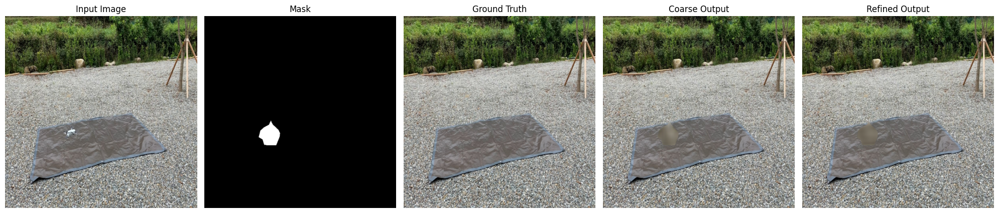

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


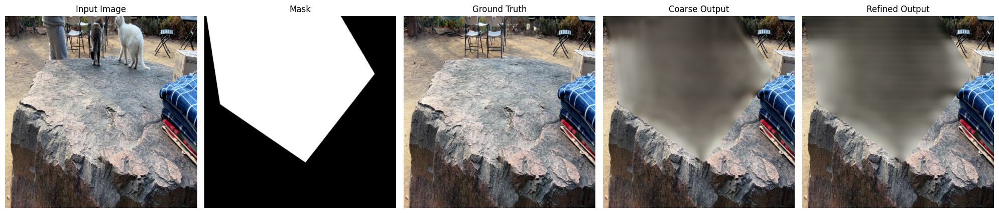

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


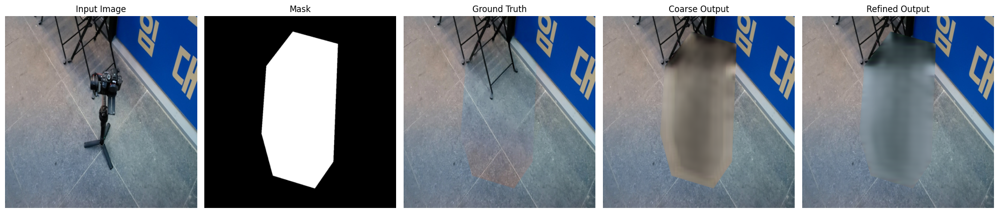

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


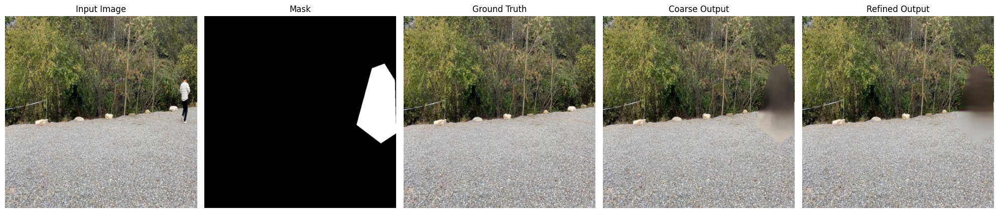

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


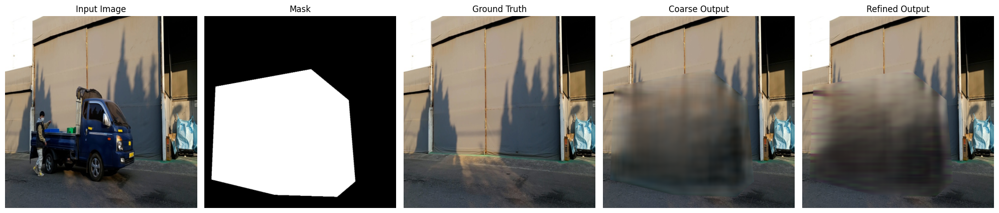

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


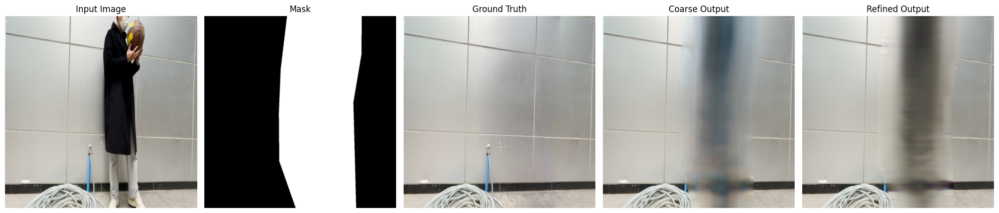

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


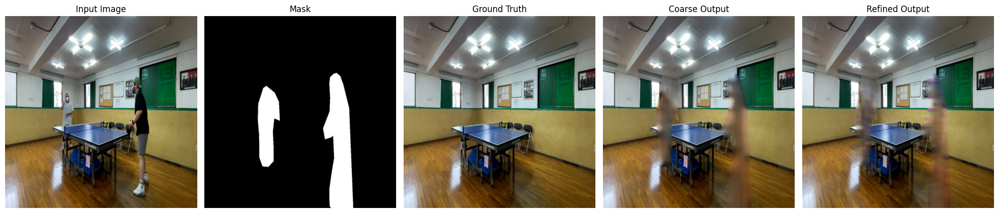

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


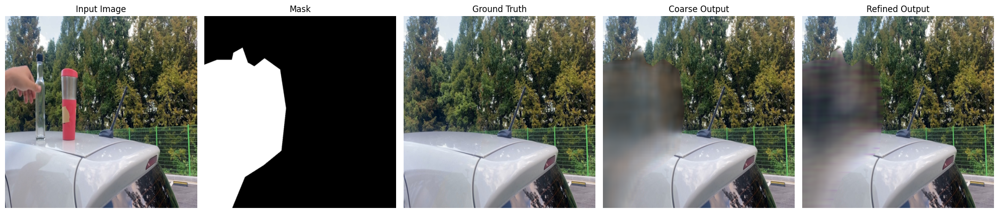

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


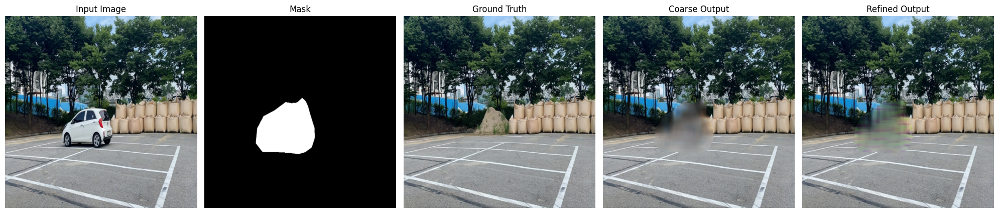

torch.Size([1, 3, 512, 512])
torch.Size([1, 1, 512, 512])
torch.Size([3, 512, 512])
torch.Size([3, 512, 512])


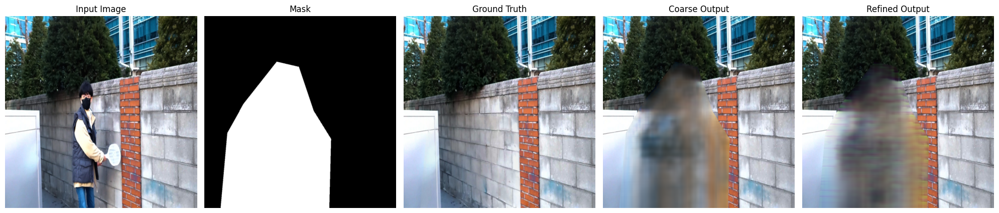

In [ ]:
for i in range(1, 6):
    test(chkpt_no=i)

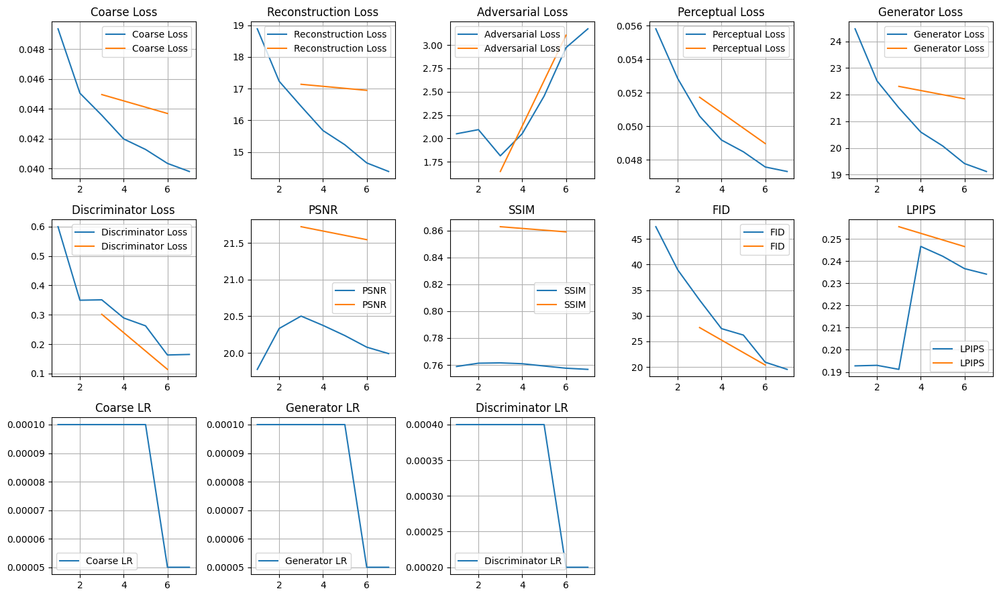

In [ ]:
import pandas as pd
train_df = pd.read_csv(TRAIN_CSV_PATH)
val_df = pd.read_csv(VAL_CSV_PATH)

train_df.to_csv(TRAIN_CSV_PATH, index=False)
val_df.to_csv(VAL_CSV_PATH, index=False)

# train: ['epoch', 'coarse_loss', 'rec_loss', 'adv_loss', 'perceptual_loss', 'gen_loss', 'disc_loss', 'psnr', 'ssim', 'fid', 'lpips', 'coarse_lr', 'gen_lr', 'disc_lr']
# val: ['epoch', 'coarse_loss', 'rec_loss', 'adv_loss', 'perceptual_loss', 'gen_loss', 'disc_loss', 'psnr', 'ssim', 'fid', 'lpips']

fig, ax = plt.subplots(3, 5, figsize=(15, 9))
ax[0][0].plot(train_df['epoch'], train_df['coarse_loss'], label='Coarse Loss')
ax[0][0].plot(val_df['epoch'], val_df['coarse_loss'], label='Coarse Loss')
ax[0][0].set_title('Coarse Loss')
ax[0][0].grid(True)
ax[0][0].legend()

ax[0][1].plot(train_df['epoch'], train_df['rec_loss'], label='Reconstruction Loss')
ax[0][1].plot(val_df['epoch'], val_df['rec_loss'], label='Reconstruction Loss')
ax[0][1].set_title('Reconstruction Loss')
ax[0][1].grid(True)
ax[0][1].legend()

ax[0][2].plot(train_df['epoch'], train_df['adv_loss'], label='Adversarial Loss')
ax[0][2].plot(val_df['epoch'], val_df['adv_loss'], label='Adversarial Loss')
ax[0][2].set_title('Adversarial Loss')
ax[0][2].grid(True)
ax[0][2].legend()

ax[0][3].plot(train_df['epoch'], train_df['perceptual_loss'], label='Perceptual Loss')
ax[0][3].plot(val_df['epoch'], val_df['perceptual_loss'], label='Perceptual Loss')
ax[0][3].set_title('Perceptual Loss')
ax[0][3].grid(True)
ax[0][3].legend()

ax[0][4].plot(train_df['epoch'], train_df['gen_loss'], label='Generator Loss')
ax[0][4].plot(val_df['epoch'], val_df['gen_loss'], label='Generator Loss')
ax[0][4].set_title('Generator Loss')
ax[0][4].grid(True)
ax[0][4].legend()

ax[1][0].plot(train_df['epoch'], train_df['disc_loss'], label='Discriminator Loss')
ax[1][0].plot(val_df['epoch'], val_df['disc_loss'], label='Discriminator Loss')
ax[1][0].set_title('Discriminator Loss')
ax[1][0].grid(True)
ax[1][0].legend()

ax[1][1].plot(train_df['epoch'], train_df['psnr'], label='PSNR')
ax[1][1].plot(val_df['epoch'], val_df['psnr'], label='PSNR')
ax[1][1].set_title('PSNR')
ax[1][1].grid(True)
ax[1][1].legend()

ax[1][2].plot(train_df['epoch'], train_df['ssim'], label='SSIM')
ax[1][2].plot(val_df['epoch'], val_df['ssim'], label='SSIM')
ax[1][2].set_title('SSIM')
ax[1][2].grid(True)
ax[1][2].legend()

ax[1][3].plot(train_df['epoch'], train_df['fid'], label='FID')
ax[1][3].plot(val_df['epoch'], val_df['fid'], label='FID')
ax[1][3].set_title('FID')
ax[1][3].grid(True)
ax[1][3].legend()

ax[1][4].plot(train_df['epoch'], train_df['lpips'], label='LPIPS')
ax[1][4].plot(val_df['epoch'], val_df['lpips'], label='LPIPS')
ax[1][4].set_title('LPIPS')
ax[1][4].grid(True)
ax[1][4].legend()

ax[2][0].plot(train_df['epoch'], train_df['coarse_lr'], label='Coarse LR')
ax[2][0].set_title('Coarse LR')
ax[2][0].grid(True)
ax[2][0].legend()

ax[2][1].plot(train_df['epoch'], train_df['gen_lr'], label='Generator LR')
ax[2][1].set_title('Generator LR')
ax[2][1].grid(True)
ax[2][1].legend()

ax[2][2].plot(train_df['epoch'], train_df['disc_lr'], label='Discriminator LR')
ax[2][2].set_title('Discriminator LR')
ax[2][2].grid(True)
ax[2][2].legend()

# turn off the rest ax
ax[2][3].axis('off')
ax[2][4].axis('off')

fig.tight_layout()
fig.savefig(f'{VAL_IMG_DIR}/comparison_plot.png')
plt.show()

In [ ]:
import pandas as pd
train_df = pd.read_csv(TRAIN_CSV_PATH)
val_df = pd.read_csv(VAL_CSV_PATH)

for chkpt_no in range(1, 10):
    chkpt_path = f'{CHKPT_DIR}/checkpoint_{chkpt_no}.pth'
    chkpt = torch.load(chkpt_path, map_location='cpu')
    print(f"Inspecting checkpoint {chkpt_no}")
    for name, param in chkpt['gen_state_dict'].items():
        if 'weight' in name:
            print(f"{name}: mean={param.mean().item()}, std={param.std().item()}, max={param.max().item()}, min={param.min().item()}")
        if param.grad is not None:
            print(f"{name} grad: mean={param.grad.mean().item()}, max={param.grad.max().item()}")

    for name, param in chkpt['disc_state_dict'].items():
        if 'weight' in name:
            print(f"{name}: mean={param.mean().item()}, std={param.std().item()}, max={param.max().item()}, min={param.min().item()}")
        if param.grad is not None:
            print(f"{name} grad: mean={param.grad.mean().item()}, max={param.grad.max().item()}")

    print(f"Coarse_lr: {chkpt['opt_coarse_state_dict']['param_groups'][0]['lr']}")
    print(f"Gen_lr: {chkpt['opt_gen_state_dict']['param_groups'][0]['lr']}")
    print(f"Disc_lr: {chkpt['opt_disc_state_dict']['param_groups'][0]['lr']}")



    # 'gen_state_dict': gen.state_dict(),
    # 'disc_state_dict': disc.state_dict(),
    # 'opt_coarse_state_dict': opt_coarse.state_dict(),
    # 'opt_gen_state_dict': opt_gen.state_dict(),
    # 'opt_disc_state_dict': opt_disc.state_dict()

<ipython-input-17-619123e335b1>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  chkpt = torch.load(chkpt_path, map_location='cpu')


Inspecting checkpoint 1
coarse_generator.coarse1.0.conv2d.weight: mean=0.0019428649684414268, std=0.05900191143155098, max=0.11453144997358322, min=-0.11526588350534439
coarse_generator.coarse1.0.mask_conv2d.single_channel_conv.weight: mean=0.010249570943415165, std=0.061023008078336716, max=0.11383074522018433, min=-0.10436876118183136
coarse_generator.coarse1.1.conv2d.weight: mean=2.9260487281135283e-05, std=0.03601614013314247, max=0.09093615412712097, min=-0.1230873242020607
coarse_generator.coarse1.1.mask_conv2d.single_channel_conv.weight: mean=0.0010624660644680262, std=0.035483673214912415, max=0.08001473546028137, min=-0.08787417411804199
coarse_generator.coarse1.2.conv2d.weight: mean=-0.00025602072128094733, std=0.03613540157675743, max=0.10568494349718094, min=-0.1178472489118576
coarse_generator.coarse1.2.mask_conv2d.single_channel_conv.weight: mean=-0.0015905651962384582, std=0.03648950159549713, max=0.07898125797510147, min=-0.07908257097005844
coarse_generator.coarse2.0.c